In [1]:
%runfile H3.py

In [2]:
from utils import (make_M_alphas, 
                   make_poly_from_edges, 
                   poly_equiv, tri0, tri1, tri2, cycle_poly, std_poly,
                   poly_gl2_orbit_reps, 
                   aas_triangle_gl2_orbit_reps, 
                   square_parameters, 
                   aaa_triangle_parameters, 
                   aas_triangle_parameters,
                   hexagon_parameters)
from polyhedra import all_poly_types, poly_type, poly_types

In [3]:
d = 15

In [4]:
kdata = make_k(d)
k = kdata['k']
w = kdata['w']
zero = k(0)
one = k(1)
Ireps = kdata['Ireps']
inf = cusp(infinity, k)
k.class_number()

2

In [5]:
alphas, sigmas = alpha_sigma_data(d, verbose=True)
#alphas = precomputed_alphas(k)
M_alphas, alpha_inv = make_M_alphas(alphas)
print("{} alphas".format(len(alphas)))

#sigmas = [cusp(s,k) for s in [oo, (w)/(2), (w + 1)/(3), (-w - 1)/(3), (-w + 1)/(3), (w - 1)/(3)]]

print("{} sigmas".format(len(sigmas)))

k = Number Field in w with defining polynomial x^2 - x + 4, class number 2
3 singular points: [oo, [w:2], [2:-w]]
Adding 1 alphas of norm 1 (plus symmetrics)
Testing alpha #1/1 = [0:1]
 no, [0:1] is not surrounded
1 alphas out of 1 with max norm 1 are not surrounded, continuing...
Adding 0 alphas of norm 4 (plus symmetrics)
Adding 0 alphas of norm 6 (plus symmetrics)
Adding 0 alphas of norm 9 (plus symmetrics)
Adding 0 alphas of norm 10 (plus symmetrics)
Adding 1 alphas of norm 15 (plus symmetrics)
Testing alpha #1/2 = [0:1]
 ok, [0:1] is surrounded
Testing alpha #2/2 = [w - 4:2*w - 1]
 ok, [w - 4:2*w - 1] is surrounded
Success using 3 alphas of with max norm 15!
3 covering alphas, max denom norm 15: [[w + 3:2*w - 1], [0:1], [w - 4:2*w - 1]]
 alphas are saturated! 3 alphas with max norm 15
After saturation we now have 3 alphas with max norm 15
# vertices for these alphas: [3, 8, 3]
After removing alphas which go through <3 vertices, we now have 3 alphas with max norm 15
3 fundamental d

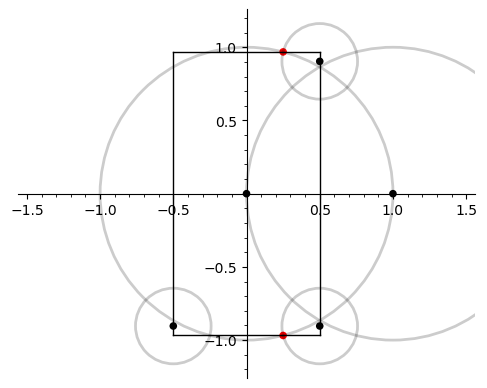

In [7]:
FD_proj = plot_FunDomain_projection(k, alphas, sigmas)
FD_proj.show(figsize=[5,5])

In [8]:
sigmas

[oo, [w:2], [-2:-w]]

In [9]:
alphas

[[0:1], [w - 4:2*w - 1], [-w + 4:2*w - 1]]

In [10]:
polys, hemis = all_polyhedra(k, alphas)
print("{} polyhedra constructed".format(len(polys)))

Constructing principal polyhedra
Found 1 orbits
Orbits:
[0, 1]
Constructed 1 polyhedra
Faces: [[4, 4, 3, 3, 4]]
Constructing polyhedra from one ideal class, sigmas [[w:2], [2:-w]]
i=0, R=[1/2*w + 1/4, 1/16], 4 Rmats
Qlist = [[1/2*w + 1/4, 1/16], [1/2*w + 1/4, 1/16], [1/2*w - 1/4, 1/16], [1/2*w - 1/4, 1/16]]
Qlist indices: [0, 0, 2, 2]
i=1, R=[7/16*w + 1/4, 1/16], 4 Rmats
Qlist = [[7/16*w + 1/4, 1/16], [7/16*w - 11/16, 1/16], [9/16*w - 5/16, 1/16], [9/16*w - 1/4, 1/16]]
Qlist indices: [1, 4, 5, 3]
Found 2 orbits with representative points [[0, 2], [1, 3, 4, 5]]:
Constructed 2 polyhedra
Faces: [[3, 3, 3, 3, 3, 3, 3, 3], [4, 3, 3, 3, 3]]
3 polyhedra constructed


In [11]:
poly_types(polys)

{'tetrahedron': 0,
 'cube': 0,
 'octahedron': 1,
 'triangular prism': 1,
 'square prism': 1,
 'hexagonal prism': 0,
 'hexagonal cap': 0,
 'truncated tetrahedron': 0,
 'cuboctahedron': 0,
 'unknown': 0}

In [12]:
all_poly_types(polys)

['triangular prism', 'octahedron', 'square prism']

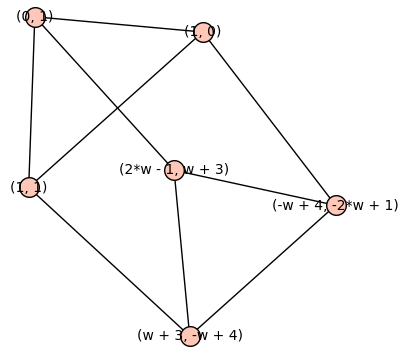

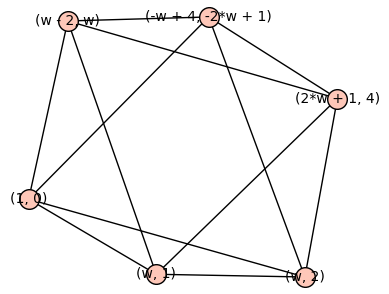

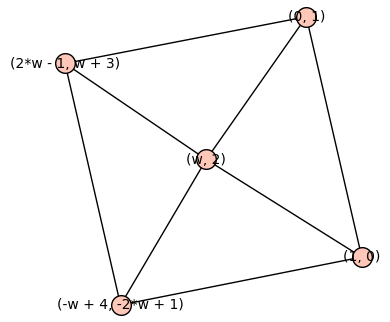

In [13]:
assert len(polys)==3
for G in polys: show(G)

In [14]:
triangles = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==3] for G in polys],[])]
squares = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==4] for G in polys],[])]
hexagons = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==6] for G in polys],[])]
aaa_triangles = [T for T in triangles if is_poly_principal(T)]
aas_triangles = [T for T in triangles if not is_poly_principal(T)]

In [15]:
[len(t) for t in [aaa_triangles, aas_triangles, squares, hexagons]]

[2, 12, 4, 0]

In [16]:
aaa_triangles0 = poly_gl2_orbit_reps(aaa_triangles, alphas)
aas_triangles0 = aas_triangle_gl2_orbit_reps(aas_triangles, alphas)
squares0 = poly_gl2_orbit_reps(squares, alphas)
hexagons0 = poly_gl2_orbit_reps(hexagons, alphas)

In [17]:
[len(t) for t in [aaa_triangles0, aas_triangles0, squares0, hexagons0]]

[1, 2, 1, 0]

In [18]:
triangles1 = [T for T in aaa_triangles0 if not any(poly_equiv(T, t) for t in [tri0(k), tri1(k), tri2(k)])]

In [19]:
aaa = [aaa_triangle_parameters(T, alphas, M_alphas) for T in triangles1]

In [20]:
aas = [aas_triangle_parameters(T, alphas, M_alphas, sigmas) for T in aas_triangles0]

15 U 0 1 2 0 -1
15 U 1 2 1 0 1


In [21]:
squ = [square_parameters(S, alphas, M_alphas, alpha_inv) for S in squares0]

15 Q 2 0 1 0 0 0 0 0 -1 0


In [22]:
hex = [hexagon_parameters(H, alphas, M_alphas) for H in hexagons0]

In [23]:
plot_Bianchi_diagram(k,hemis)

Graphics3d Object